# Project: RoadSense — Driving Scene Classification & Object Detection

RoadSense is a deep learning project that tackles two key perception tasks in autonomous driving:

1. Scene Classification – Predicting the environment type, time of day, and weather condition using a custom multi-head ResNet18 model.
2. Object Detection – Identifying vehicles, traffic lights (with color), and road signs using YOLOv5.

The project is trained on the BDD100K dataset with a subset of 10k images. Scene classification uses a shared convolutional base with three output heads for multi-task learning, while YOLOv5 is used for bounding-box object detection.

Models Used:

- Multi-task ResNet18 for scene, time, and weather classification
- YOLOv5 for object detection and localization

Both models were chosen for their balance between speed and performance in real-world driving datasets.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q "/content/drive/MyDrive/Deep_Learning_Mini_Project/bdd100k_images_10k.zip" -d /content/bdd100k/
!unzip -q "/content/drive/MyDrive/Deep_Learning_Mini_Project/bdd100k_labels.zip" -d /content/bdd100k/

# Scene Classification using ResNet18

In [ ]:
import os
import json
from collections import Counter
from tqdm import tqdm

def count_attribute_distribution(label_dir, attribute_name):
    attribute_counter = Counter()

    for file in tqdm(os.listdir(label_dir), desc=f"==== Processing {attribute_name}"):
        if not file.endswith(".json"):
            continue

        with open(os.path.join(label_dir, file), 'r') as f:
            data = json.load(f)
            attribute_value = data.get("attributes", {}).get(attribute_name)
            if attribute_value:
                attribute_counter[attribute_value] += 1

    # Display result
    print(f"{attribute_name.capitalize()} Distribution in {label_dir}:")
    for value, count in attribute_counter.items():
        print(f"{value:<12}: {count} images")

    return attribute_counter

In [ ]:
label_dir = "/content/bdd100k/100k/train"
scene_counts = count_attribute_distribution(label_dir, "scene")
timeofday_counts = count_attribute_distribution(label_dir, "timeofday")
weather_counts = count_attribute_distribution(label_dir, "weather")

==== Processing scene: 100%|██████████| 70000/70000 [00:09<00:00, 7337.71it/s]


Scene Distribution in /content/bdd100k/100k/train:
city street : 43581 images
highway     : 17414 images
residential : 8105 images
parking lot : 378 images
undefined   : 366 images
tunnel      : 129 images
gas stations: 27 images


==== Processing timeofday: 100%|██████████| 70000/70000 [00:08<00:00, 7986.53it/s]


Timeofday Distribution in /content/bdd100k/100k/train:
dawn/dusk   : 5033 images
daytime     : 36800 images
night       : 28028 images
undefined   : 139 images


==== Processing weather: 100%|██████████| 70000/70000 [00:08<00:00, 8275.90it/s]

Weather Distribution in /content/bdd100k/100k/train:
overcast    : 8784 images
clear       : 37412 images
undefined   : 8134 images
rainy       : 5083 images
partly cloudy: 4886 images
snowy       : 5571 images
foggy       : 130 images


Here we are identifying the available classes with respective number of images in each attributes in the BDD100k dataset.

In [ ]:
import os, json, shutil, csv
from tqdm import tqdm

# Paths
label_dirs = ["/content/bdd100k/100k/train", "/content/bdd100k/100k/val"]
image_dirs = ["/content/bdd100k/10k/train", "/content/bdd100k/10k/val"]
output_dir = "/content/bdd_filtered_all_labels"
os.makedirs(output_dir, exist_ok=True)

# Attribute mappings
scene_map = {
    "city street": 0,
    "residential": 1,
    "highway": 2,
    "tunnel": 3
}
time_map = {
    "daytime": 0,
    "night": 1,
    "dawn/dusk": 2
}
weather_map = {
    "clear": 0,
    "overcast": 1,
    "rainy": 2,
    "partly cloudy": 3,
    "snowy": 4,
    "foggy": 5
}

# Collecting available images
available_images = {}
for img_dir in image_dirs:
    for fname in os.listdir(img_dir):
        if fname.endswith(".jpg"):
            available_images[fname] = os.path.join(img_dir, fname)

# Metadata CSV path
csv_path = os.path.join(output_dir, "metadata.csv")
csv_file = open(csv_path, mode="w", newline="")
csv_writer = csv.writer(csv_file)
csv_writer.writerow(["image_path", "scene_label", "timeofday_label", "weather_label"])

count = 0

# Processing labels and create metadata.csv
for label_dir in label_dirs:
    for fname in tqdm(os.listdir(label_dir)):
        if not fname.endswith(".json"):
            continue

        json_path = os.path.join(label_dir, fname)
        with open(json_path, 'r') as f:
            data = json.load(f)

        attr = data.get("attributes", {})
        scene = scene_map.get(attr.get("scene"))
        time = time_map.get(attr.get("timeofday"))
        weather = weather_map.get(attr.get("weather"))

        if scene is None or time is None or weather is None:
            continue

        img_name = fname.replace(".json", ".jpg")
        src_path = available_images.get(img_name)
        if not src_path:
            continue

        # Copying to flat folder
        dst_path = os.path.join(output_dir, img_name)
        shutil.copy(src_path, dst_path)

        # Writing to CSV
        csv_writer.writerow([dst_path, scene, time, weather])
        count += 1

csv_file.close()
print(f"\nMetadata written for {count} images to {csv_path}")

100%|██████████| 10000/10000 [00:01<00:00, 5936.39it/s]


Metadata written for 2804 images to /content/bdd_filtered_all_labels/metadata.csv


Here we are looping through each label file, extracting the scene, time, and weather information, mapping them to numbers, copying the matching image to the output folder, and writing its details to the metadata.csv (only if all three attributes are present).

In [ ]:
from google.colab import files

# Downloading the metadata.csv file to our local machine
files.download("/content/bdd_filtered_all_labels/metadata.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import torch
import csv

class MultiLabelBDD(Dataset):
    def __init__(self, csv_file, transform=None):
        self.samples = []
        self.transform = transform

        # Reading metadata.csv
        with open(csv_file, 'r') as f:
            reader = csv.reader(f)
            next(reader)  # Skipping the header
            for row in reader:
                image_path, scene, time, weather = row
                self.samples.append((image_path, int(scene), int(time), int(weather)))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        image_path, scene, time, weather = self.samples[idx]
        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(scene), torch.tensor(time), torch.tensor(weather)

In [ ]:
from torchvision import transforms
from torch.utils.data import random_split, DataLoader

# Transforms
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# Dataset
csv_path = "/content/bdd_filtered_all_labels/metadata.csv"
dataset = MultiLabelBDD(csv_path, transform=val_test_transform)

# Splitting
total_size = len(dataset)
train_size = int(0.8 * total_size)
val_size = int(0.1 * total_size)
test_size = total_size - train_size - val_size

print(f"Total Size: {total_size}")
print(f"Train Size: {train_size}")
print(f"Val Size: {val_size}")
print(f"Test Size: {test_size}")

train_ds, val_ds, test_ds = random_split(dataset, [train_size, val_size, test_size])

# Assigning different transforms
train_ds.dataset.transform = train_transform
val_ds.dataset.transform = val_test_transform
test_ds.dataset.transform = val_test_transform

# Loaders
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)
test_loader = DataLoader(test_ds, batch_size=32)

Total Size: 2804
Train Size: 2243
Val Size: 280
Test Size: 281


In [ ]:
# Defining Multi-Task ResNet18 + Optimizer

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Detecting device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Loading pretrained ResNet18
base_model = models.resnet18(pretrained=True)

class MultiTaskResNet(nn.Module):
    def __init__(self, base_model, num_scene, num_time, num_weather):
        super(MultiTaskResNet, self).__init__()
        self.shared = nn.Sequential(*list(base_model.children())[:-1])  # All layers except final FC
        in_features = base_model.fc.in_features

        self.scene_head = nn.Linear(in_features, num_scene)
        self.time_head = nn.Linear(in_features, num_time)
        self.weather_head = nn.Linear(in_features, num_weather)

    def forward(self, x):
        x = self.shared(x)
        x = x.view(x.size(0), -1)

        scene_out = self.scene_head(x)
        time_out = self.time_head(x)
        weather_out = self.weather_head(x)
        return scene_out, time_out, weather_out

# Define model
model = MultiTaskResNet(base_model, num_scene=4, num_time=3, num_weather=6)
model = model.to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0003)

Using device: cuda


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 194MB/s]


In [ ]:
# Training Loop for Multi-Output Model with metric tracking

import copy

def train_model(model, train_loader, val_loader, epochs=10, patience=3):
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_scene_acc": [],
        "val_scene_acc": [],
        "train_time_acc": [],
        "val_time_acc": [],
        "train_weather_acc": [],
        "val_weather_acc": [],
    }

    best_val_loss = float('inf')
    best_model_wts = copy.deepcopy(model.state_dict())
    patience_counter = 0

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        correct_s, correct_t, correct_w, total = 0, 0, 0, 0

        for images, scene_labels, time_labels, weather_labels in train_loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            optimizer.zero_grad()
            out_scene, out_time, out_weather = model(images)

            loss_scene = criterion(out_scene, scene_labels)
            loss_time = criterion(out_time, time_labels)
            loss_weather = criterion(out_weather, weather_labels)

            loss = loss_scene + loss_time + loss_weather
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            correct_s += (out_scene.argmax(1) == scene_labels).sum().item()
            correct_t += (out_time.argmax(1) == time_labels).sum().item()
            correct_w += (out_weather.argmax(1) == weather_labels).sum().item()
            total += images.size(0)

        train_acc_s = 100 * correct_s / total
        train_acc_t = 100 * correct_t / total
        train_acc_w = 100 * correct_w / total
        avg_train_loss = train_loss / total

        # Validation
        model.eval()
        val_loss = 0.0
        correct_s, correct_t, correct_w, total = 0, 0, 0, 0

        with torch.no_grad():
            for images, scene_labels, time_labels, weather_labels in val_loader:
                images = images.to(device)
                scene_labels = scene_labels.to(device)
                time_labels = time_labels.to(device)
                weather_labels = weather_labels.to(device)

                out_scene, out_time, out_weather = model(images)

                loss_scene = criterion(out_scene, scene_labels)
                loss_time = criterion(out_time, time_labels)
                loss_weather = criterion(out_weather, weather_labels)

                loss = loss_scene + loss_time + loss_weather
                val_loss += loss.item() * images.size(0)

                correct_s += (out_scene.argmax(1) == scene_labels).sum().item()
                correct_t += (out_time.argmax(1) == time_labels).sum().item()
                correct_w += (out_weather.argmax(1) == weather_labels).sum().item()
                total += images.size(0)

        val_acc_s = 100 * correct_s / total
        val_acc_t = 100 * correct_t / total
        val_acc_w = 100 * correct_w / total
        avg_val_loss = val_loss / total

        print(f"[Epoch {epoch+1}] Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
        print(f"            Scene Acc: {train_acc_s:.2f}% → {val_acc_s:.2f}%, "
              f"Time Acc: {train_acc_t:.2f}% → {val_acc_t:.2f}%, "
              f"Weather Acc: {train_acc_w:.2f}% → {val_acc_w:.2f}%")

        # Storing history
        history["train_loss"].append(avg_train_loss)
        history["val_loss"].append(avg_val_loss)
        history["train_scene_acc"].append(train_acc_s)
        history["val_scene_acc"].append(val_acc_s)
        history["train_time_acc"].append(train_acc_t)
        history["val_time_acc"].append(val_acc_t)
        history["train_weather_acc"].append(train_acc_w)
        history["val_weather_acc"].append(val_acc_w)

        # Early stopping logic
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            patience_counter = 0
            torch.save(model.state_dict(), "best_model.pt")
            print("Best model updated and saved.")
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Loading the best model
    model.load_state_dict(best_model_wts)
    print("Training complete.")
    return history

In the above train_model function,
- correct_s = Count of correct predictions for scene label during training/val
- correct_t = Count of correct predictions for time of day label
- correct_w = Count of correct predictions for weather label
- total = Total number of samples processed in that epoch (same across all tasks)

In [ ]:
# Train the multi-task model
history = train_model(model, train_loader, val_loader, epochs=20, patience=3)

[Epoch 1] Loss: 2.0763, Val Loss: 1.7121
            Scene Acc: 68.26% → 72.14%, Time Acc: 88.72% → 87.14%, Weather Acc: 63.84% → 78.21%
Best model updated and saved.
[Epoch 2] Loss: 0.9925, Val Loss: 1.9478
            Scene Acc: 83.10% → 68.57%, Time Acc: 94.25% → 85.00%, Weather Acc: 85.60% → 75.00%
[Epoch 3] Loss: 0.4242, Val Loss: 2.1951
            Scene Acc: 93.89% → 72.50%, Time Acc: 97.68% → 87.14%, Weather Acc: 95.23% → 71.43%
[Epoch 4] Loss: 0.2557, Val Loss: 2.2304
            Scene Acc: 97.28% → 69.29%, Time Acc: 99.24% → 88.21%, Weather Acc: 96.08% → 75.36%
Early stopping triggered.
Training complete.


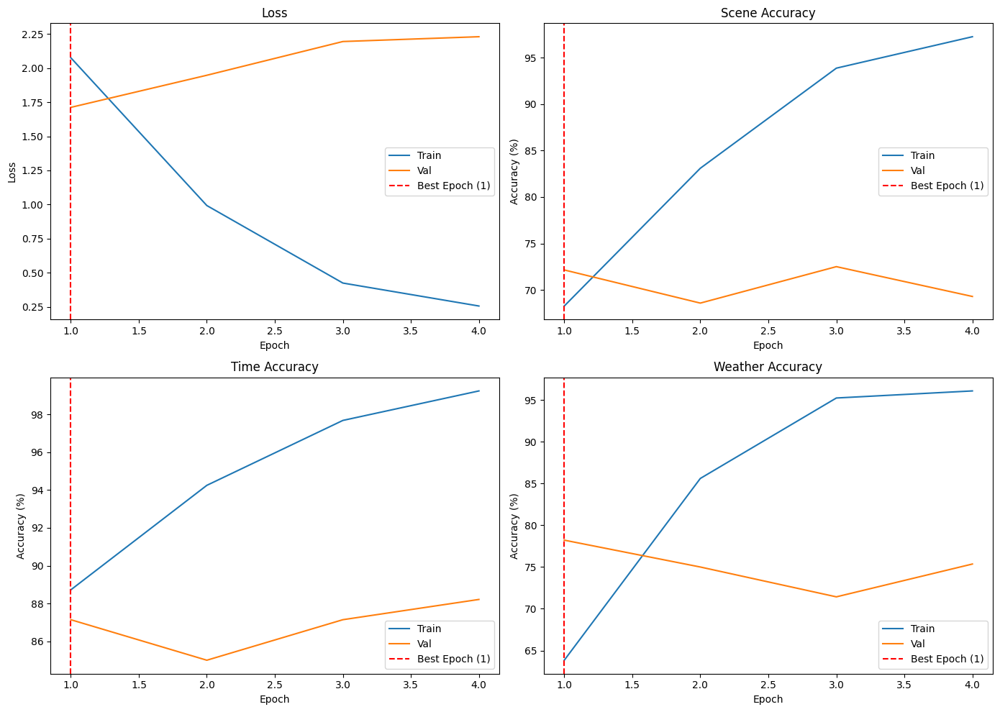

In [ ]:
import matplotlib.pyplot as plt

epochs = len(history["train_loss"])
x = list(range(1, epochs + 1))
best_epoch = history["val_loss"].index(min(history["val_loss"])) + 1  # +1 to match epoch number

fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Loss
axs[0, 0].plot(x, history["train_loss"], label="Train")
axs[0, 0].plot(x, history["val_loss"], label="Val")
axs[0, 0].axvline(x=best_epoch, color='red', linestyle='--', label=f"Best Epoch ({best_epoch})")
axs[0, 0].set_title("Loss")
axs[0, 0].set_xlabel("Epoch")
axs[0, 0].set_ylabel("Loss")
axs[0, 0].legend()

# Plot 2: Scene Accuracy
axs[0, 1].plot(x, history["train_scene_acc"], label="Train")
axs[0, 1].plot(x, history["val_scene_acc"], label="Val")
axs[0, 1].axvline(x=best_epoch, color='red', linestyle='--', label=f"Best Epoch ({best_epoch})")
axs[0, 1].set_title("Scene Accuracy")
axs[0, 1].set_xlabel("Epoch")
axs[0, 1].set_ylabel("Accuracy (%)")
axs[0, 1].legend()

# Plot 3: Time Accuracy
axs[1, 0].plot(x, history["train_time_acc"], label="Train")
axs[1, 0].plot(x, history["val_time_acc"], label="Val")
axs[1, 0].axvline(x=best_epoch, color='red', linestyle='--', label=f"Best Epoch ({best_epoch})")
axs[1, 0].set_title("Time Accuracy")
axs[1, 0].set_xlabel("Epoch")
axs[1, 0].set_ylabel("Accuracy (%)")
axs[1, 0].legend()

# Plot 4: Weather Accuracy
axs[1, 1].plot(x, history["train_weather_acc"], label="Train")
axs[1, 1].plot(x, history["val_weather_acc"], label="Val")
axs[1, 1].axvline(x=best_epoch, color='red', linestyle='--', label=f"Best Epoch ({best_epoch})")
axs[1, 1].set_title("Weather Accuracy")
axs[1, 1].set_xlabel("Epoch")
axs[1, 1].set_ylabel("Accuracy (%)")
axs[1, 1].legend()

plt.tight_layout()
plt.show()

**Model Evaluation and Improvements:**

Previously, the multi-task ResNet18 model suffered from severe overfitting:

- Training loss decreased rapidly, while validation loss increased.
- Scene and weather accuracy were unstable and low (Scene: ~65–77%, Weather: ~66–76%).
- Only time-of-day classification showed consistent performance.

**Improvements Made:**

To address the overfitting and improve generalization:
- Data Preprocessing Enhancements were added (e.g., normalization, augmentation).
- Early stopping was implemented to prevent overtraining.
- Label cleanup and better class handling likely helped reduce noise.

In [ ]:
# Evaluating on Test Set (Scene, Time, Weather)

def evaluate_model(model, test_loader):
    model.eval()
    correct_s = correct_t = correct_w = 0
    total = 0

    with torch.no_grad():
        for images, scene_labels, time_labels, weather_labels in test_loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            out_scene, out_time, out_weather = model(images)

            correct_s += (out_scene.argmax(1) == scene_labels).sum().item()
            correct_t += (out_time.argmax(1) == time_labels).sum().item()
            correct_w += (out_weather.argmax(1) == weather_labels).sum().item()
            total += images.size(0)

    print(f"Test Accuracy → Scene: {100 * correct_s / total:.2f}%, "
          f"Time: {100 * correct_t / total:.2f}%, "
          f"Weather: {100 * correct_w / total:.2f}%")

In [ ]:
# Evaluate performance on test set
model.load_state_dict(torch.load("best_model.pt"))
evaluate_model(model, test_loader)

Test Accuracy → Scene: 66.90%, Time: 87.90%, Weather: 74.73%


In [ ]:
# Visualizing Predictions from Test Set

import matplotlib.pyplot as plt
import numpy as np

# Index-to-class mappings
scene_idx_to_class = {0: "city street", 1: "residential", 2: "highway", 3: "tunnel"}
time_idx_to_class = {0: "daytime", 1: "night", 2: "dawn/dusk"}
weather_idx_to_class = {0: "clear", 1: "overcast", 2: "rainy", 3: "partly cloudy", 4: "snowy", 5: "foggy"}

def show_predictions(model, loader, num_images=6):
    model.eval()
    shown = 0
    plt.figure(figsize=(18, 10))

    with torch.no_grad():
        for images, scene_labels, time_labels, weather_labels in loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            out_scene, out_time, out_weather = model(images)
            preds_s = out_scene.argmax(1)
            preds_t = out_time.argmax(1)
            preds_w = out_weather.argmax(1)

            for i in range(images.size(0)):
                if shown >= num_images:
                    break

                img = images[i].cpu().permute(1, 2, 0).numpy()
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # unnormalize
                img = np.clip(img, 0, 1)

                true_scene = scene_idx_to_class[scene_labels[i].item()]
                pred_scene = scene_idx_to_class[preds_s[i].item()]

                true_time = time_idx_to_class[time_labels[i].item()]
                pred_time = time_idx_to_class[preds_t[i].item()]

                true_weather = weather_idx_to_class[weather_labels[i].item()]
                pred_weather = weather_idx_to_class[preds_w[i].item()]

                title = (f"Scene: {pred_scene} ({'Correct' if pred_scene == true_scene else 'Incorrect'})\n"
                         f"Time: {pred_time} ({'Correct' if pred_time == true_time else 'Incorrect'})\n"
                         f"Weather: {pred_weather} ({'Correct' if pred_weather == true_weather else 'Incorrect'})")

                plt.subplot(2, 3, shown + 1)
                plt.imshow(img)
                plt.title(title, fontsize=10)
                plt.axis('off')

                shown += 1
            if shown >= num_images:
                break

    plt.tight_layout()
    plt.show()

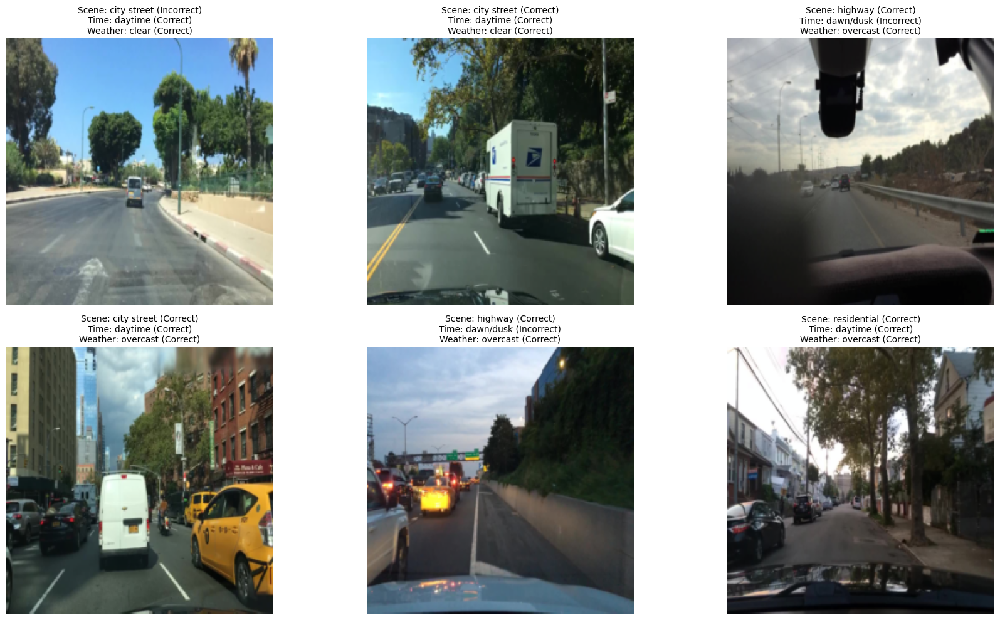

In [ ]:
# Show a few visual predictions
show_predictions(model, test_loader, num_images=6)

In [ ]:
# Implementing Grad-CAM Hooks for Multi-Output Model

gradients = None
activations = None

def save_gradient_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

def save_activation_hook(module, input, output):
    global activations
    activations = output

# Hook into final ResNet block before global avg pooling
target_layer = model.shared[7]
target_layer.register_forward_hook(save_activation_hook)
target_layer.register_backward_hook(save_gradient_hook)

In [ ]:
# Preprocess a single image (from test set path)
def preprocess_image(image_path):
    img = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
    return transform(img).unsqueeze(0).to(device), img

In [ ]:
# Generating Grad-CAM (Multi-Task)

def generate_gradcam(image_tensor, class_idx, target_head="scene"):
    model.eval()

    # Forward pass
    scene_out, time_out, weather_out = model(image_tensor)

    # Select correct output head
    if target_head == "scene":
        target = scene_out
    elif target_head == "time":
        target = time_out
    elif target_head == "weather":
        target = weather_out
    else:
        raise ValueError("target_head must be one of: 'scene', 'time', 'weather'")

    # Backward pass on selected class
    model.zero_grad()
    one_hot = torch.zeros_like(target)
    one_hot[0][class_idx] = 1
    target.backward(gradient=one_hot)

    # Grad-CAM logic
    pooled_grad = torch.mean(gradients, dim=[0, 2, 3])
    act = activations[0]
    for i in range(act.shape[0]):
        act[i, :, :] *= pooled_grad[i]

    heatmap = act.mean(dim=0).cpu().detach().numpy()
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-8

    return heatmap

In [ ]:
# Overlay + Display

import cv2

def show_gradcam(image_path, class_idx, class_name, target_head="scene"):
    image_tensor, orig_img = preprocess_image(image_path)
    heatmap = generate_gradcam(image_tensor, class_idx, target_head)

    # Resize + overlay
    heatmap = cv2.resize(heatmap, (orig_img.width, orig_img.height))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    orig_np = np.array(orig_img)
    overlay = cv2.addWeighted(orig_np, 0.6, heatmap_color, 0.4, 0)

    # Plot
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(orig_img)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title(f"Overlay (Pred: {class_name}) [{target_head}]")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Show Grad-CAM for predicted labels automatically

def run_gradcam_on_prediction(image_path):
    # Preprocess
    image_tensor, _ = preprocess_image(image_path)

    # Forward pass
    scene_out, time_out, weather_out = model(image_tensor)

    # Get predicted indices
    scene_idx = scene_out.argmax(1).item()
    time_idx = time_out.argmax(1).item()
    weather_idx = weather_out.argmax(1).item()

    # Label mappings
    scene_idx_to_class = {0: "city street", 1: "residential", 2: "highway", 3: "tunnel"}
    time_idx_to_class = {0: "daytime", 1: "night", 2: "dawn/dusk"}
    weather_idx_to_class = {
        0: "clear", 1: "overcast", 2: "rainy", 3: "partly cloudy", 4: "snowy", 5: "foggy"
    }

    # Display predictions (optional)
    print(f"Predicted Scene   → {scene_idx_to_class[scene_idx]} ({scene_idx})")
    print(f"Predicted Time    → {time_idx_to_class[time_idx]} ({time_idx})")
    print(f"Predicted Weather → {weather_idx_to_class[weather_idx]} ({weather_idx})")

    # Run Grad-CAMs
    show_gradcam(image_path, class_idx=scene_idx,
                 class_name=scene_idx_to_class[scene_idx], target_head="scene")

    show_gradcam(image_path, class_idx=time_idx,
                 class_name=time_idx_to_class[time_idx], target_head="time")

    show_gradcam(image_path, class_idx=weather_idx,
                 class_name=weather_idx_to_class[weather_idx], target_head="weather")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Predicted Scene   → city street (0)
Predicted Time    → dawn/dusk (2)
Predicted Weather → snowy (4)


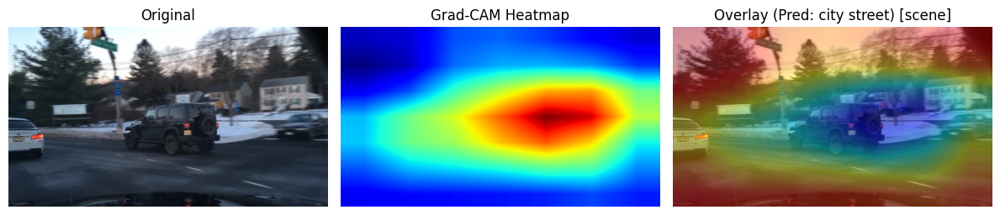

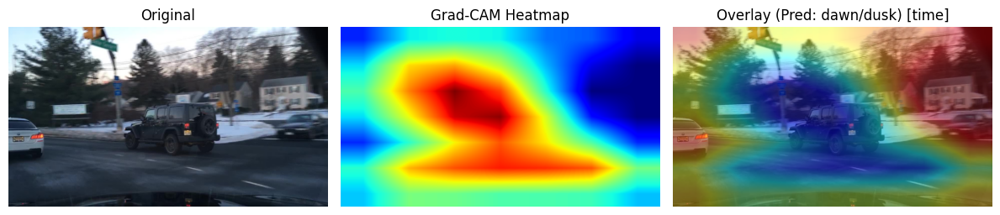

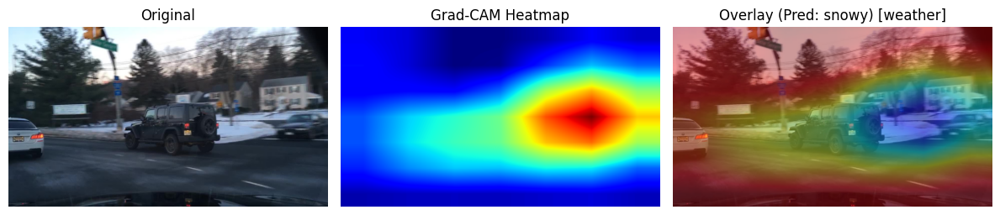

In [ ]:
image_path = "/content/bdd_filtered_all_labels/0ac3cbf4-73c76d25.jpg"
run_gradcam_on_prediction(image_path)

Predicted Scene   → residential (1)
Predicted Time    → daytime (0)
Predicted Weather → clear (0)


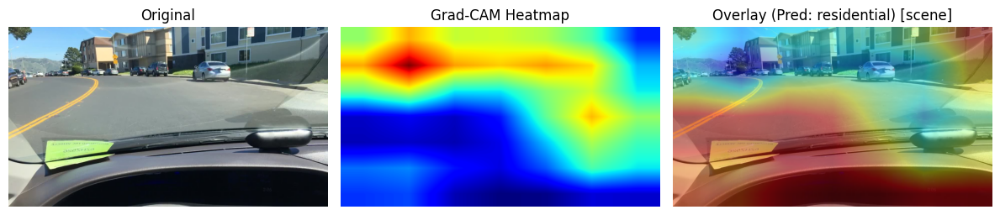

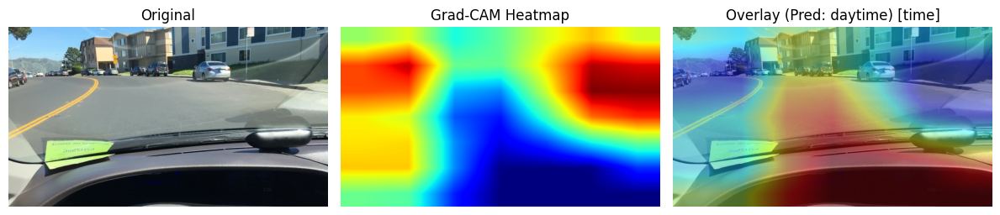

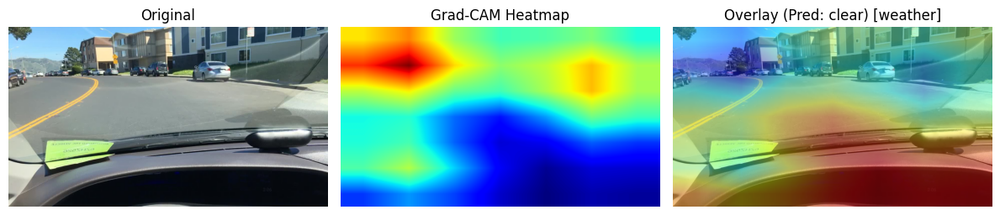

In [ ]:
image_path = "/content/bdd_filtered_all_labels/0cdde16a-e2d9677e.jpg"
run_gradcam_on_prediction(image_path)

Predicted Scene   → highway (2)
Predicted Time    → daytime (0)
Predicted Weather → rainy (2)


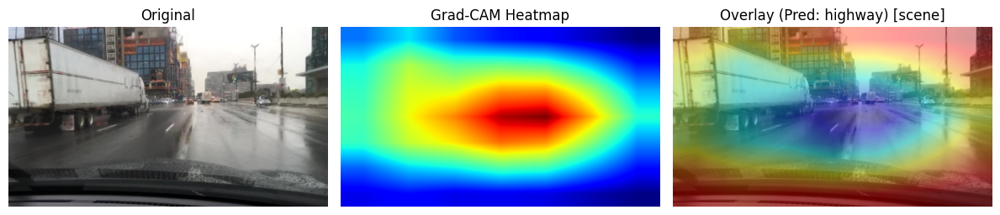

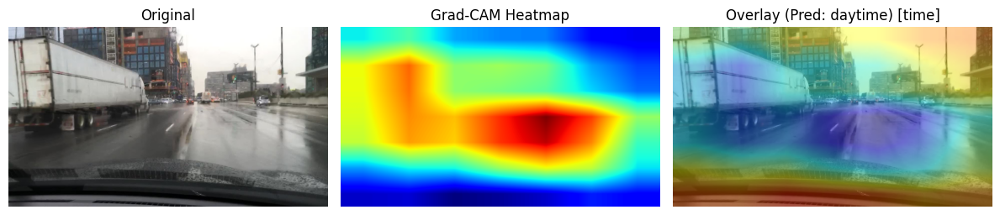

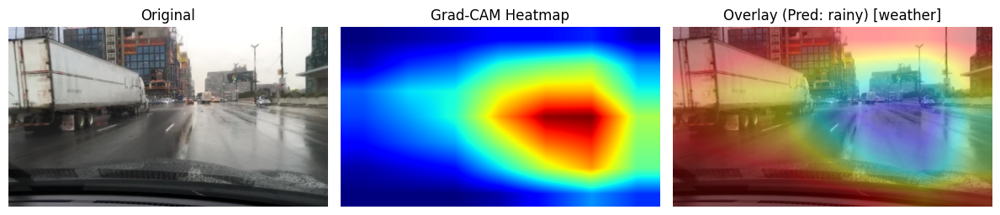

In [ ]:
image_path = "/content/bdd_filtered_all_labels/1a07eecb-5d4efd09.jpg"
run_gradcam_on_prediction(image_path)

In [ ]:
# Collecting multiple wrong predicted sample

def get_multiple_wrong_predictions(n=5):
    model.eval()
    collected = []

    with torch.no_grad():
        for images, scene_labels, time_labels, weather_labels in test_loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            scene_out, time_out, weather_out = model(images)
            scene_preds = scene_out.argmax(1)
            time_preds = time_out.argmax(1)
            weather_preds = weather_out.argmax(1)

            for i in range(len(images)):
                if (scene_preds[i] != scene_labels[i] or
                    time_preds[i] != time_labels[i] or
                    weather_preds[i] != weather_labels[i]):

                    img_tensor = images[i].cpu()
                    img_np = img_tensor.permute(1, 2, 0).numpy()
                    img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                    img_np = np.clip(img_np, 0, 1)

                    # Store in-memory object
                    collected.append({
                        "image_np": img_np,
                        "scene_pred": scene_preds[i].item(),
                        "scene_true": scene_labels[i].item(),
                        "time_pred": time_preds[i].item(),
                        "time_true": time_labels[i].item(),
                        "weather_pred": weather_preds[i].item(),
                        "weather_true": weather_labels[i].item()
                    })

                    if len(collected) >= n:
                        return collected

    return collected

In [ ]:
# Visualizing Grad-CAM for All Wrong Samples

def visualize_wrong_gradcams(wrong_samples):
    # Label maps
    scene_idx_to_class = {0: "city street", 1: "residential", 2: "highway", 3: "tunnel"}
    time_idx_to_class = {0: "daytime", 1: "night", 2: "dawn/dusk"}
    weather_idx_to_class = {
        0: "clear", 1: "overcast", 2: "rainy", 3: "partly cloudy", 4: "snowy", 5: "foggy"
    }

    for idx, sample in enumerate(wrong_samples):
        print(f"\n==== Sample {idx + 1} ====")

        # Save image temporarily to use Grad-CAM
        temp_path = f"misclassified_{idx}.jpg"
        Image.fromarray((sample["image_np"] * 255).astype(np.uint8)).save(temp_path)

        # Display predictions
        for head, pred_idx, true_idx, class_map in [
            ("scene", sample["scene_pred"], sample["scene_true"], scene_idx_to_class),
            ("time", sample["time_pred"], sample["time_true"], time_idx_to_class),
            ("weather", sample["weather_pred"], sample["weather_true"], weather_idx_to_class),
        ]:
            pred_label = class_map[pred_idx]
            true_label = class_map[true_idx]
            correctness = "Correct" if pred_idx == true_idx else "Wrong"
            print(f"{head.capitalize():<8}: Pred = {pred_label} ({pred_idx}), True = {true_label} ({true_idx}) → {correctness}")

            # Grad-CAM overlay
            show_gradcam(temp_path, class_idx=pred_idx, class_name=f"{pred_label} (pred)", target_head=head)

In [ ]:
# Get multiple wrong predictions
model.load_state_dict(torch.load("best_model.pt"))
wrong_samples = get_multiple_wrong_predictions(n=5)


==== Sample 1 ====
Scene   : Pred = city street (0), True = city street (0) → Correct


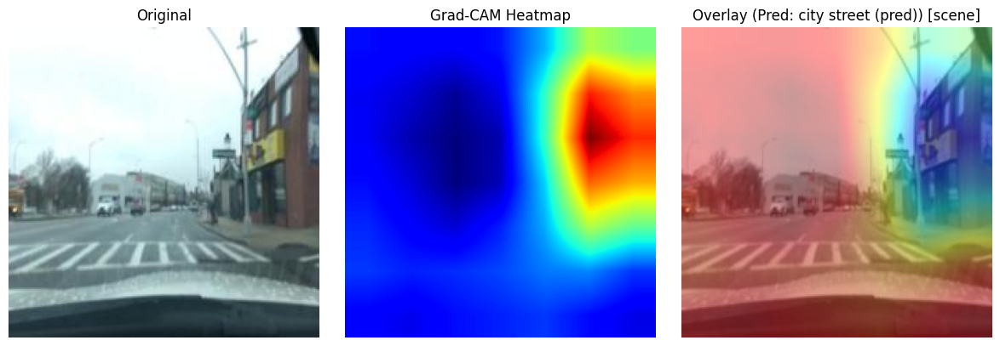

Time    : Pred = daytime (0), True = daytime (0) → Correct


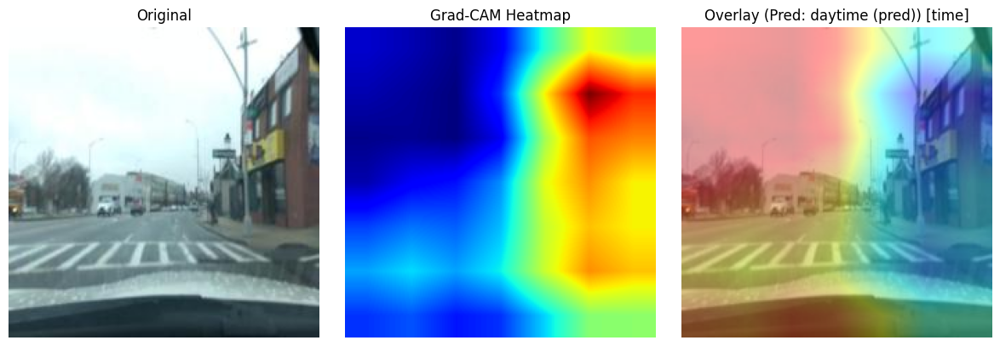

Weather : Pred = overcast (1), True = rainy (2) → Wrong


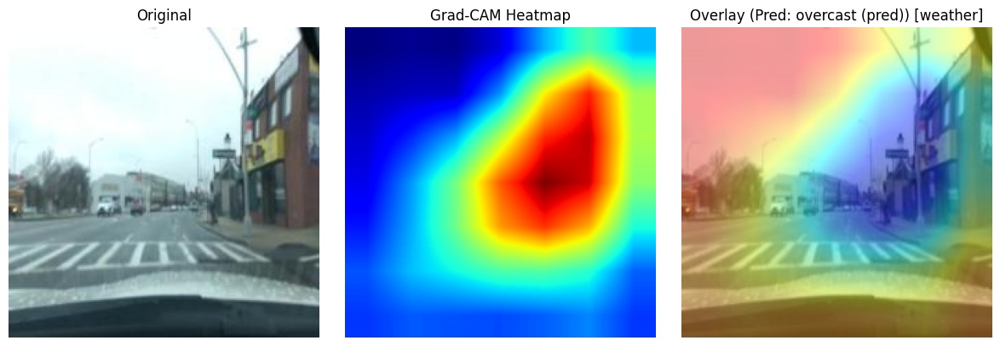


==== Sample 2 ====
Scene   : Pred = highway (2), True = highway (2) → Correct


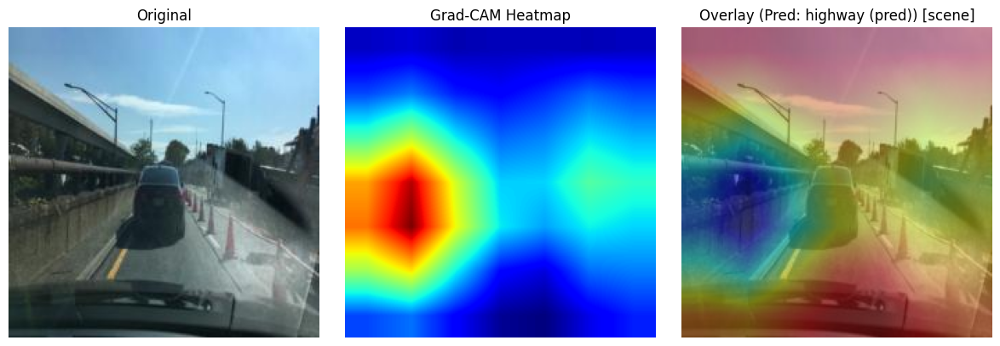

Time    : Pred = daytime (0), True = dawn/dusk (2) → Wrong


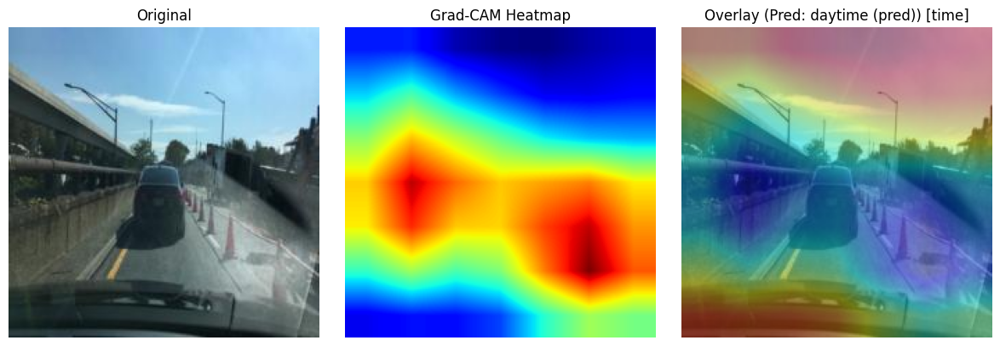

Weather : Pred = clear (0), True = partly cloudy (3) → Wrong


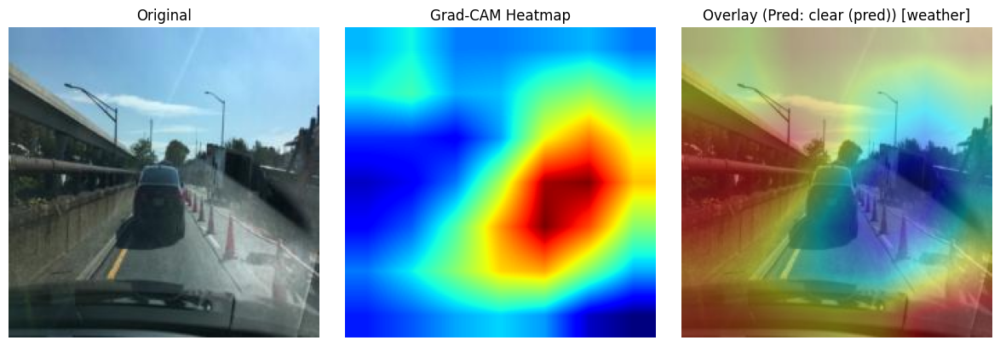


==== Sample 3 ====
Scene   : Pred = city street (0), True = city street (0) → Correct


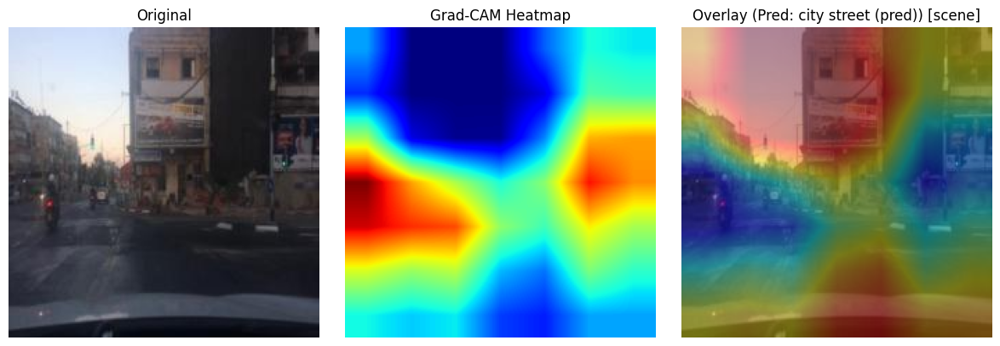

Time    : Pred = dawn/dusk (2), True = daytime (0) → Wrong


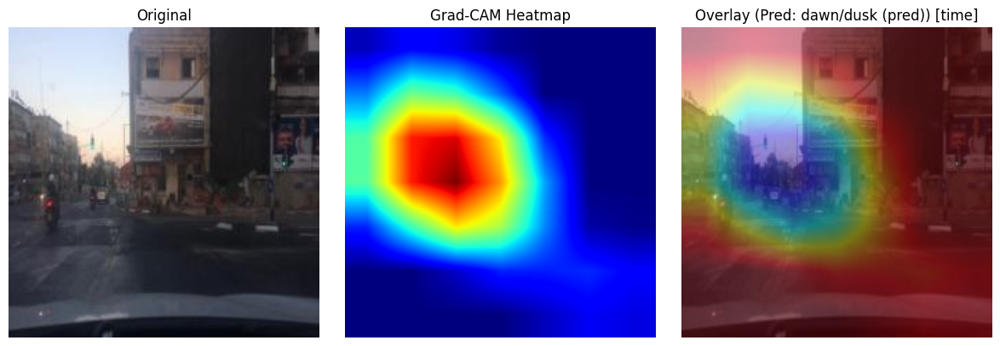

Weather : Pred = clear (0), True = clear (0) → Correct


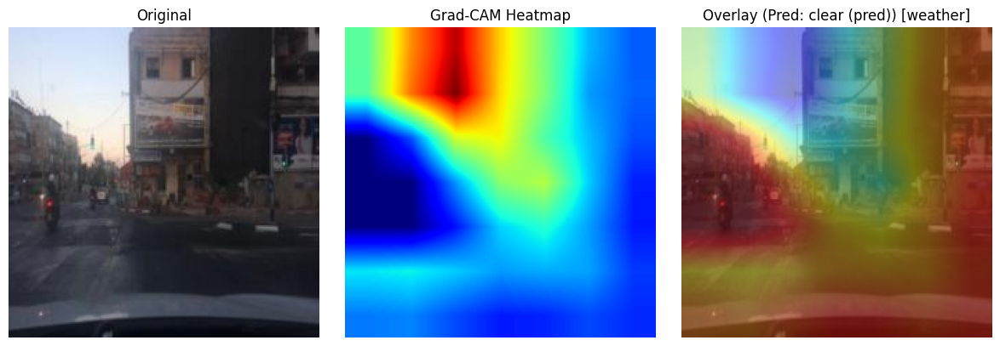


==== Sample 4 ====
Scene   : Pred = highway (2), True = city street (0) → Wrong


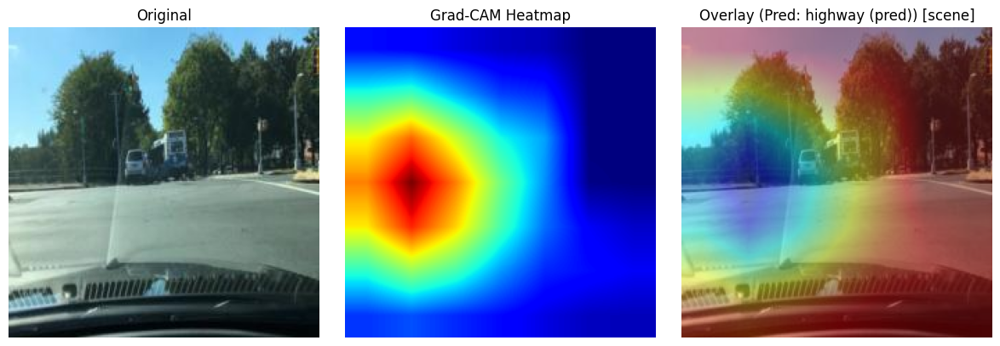

Time    : Pred = daytime (0), True = daytime (0) → Correct


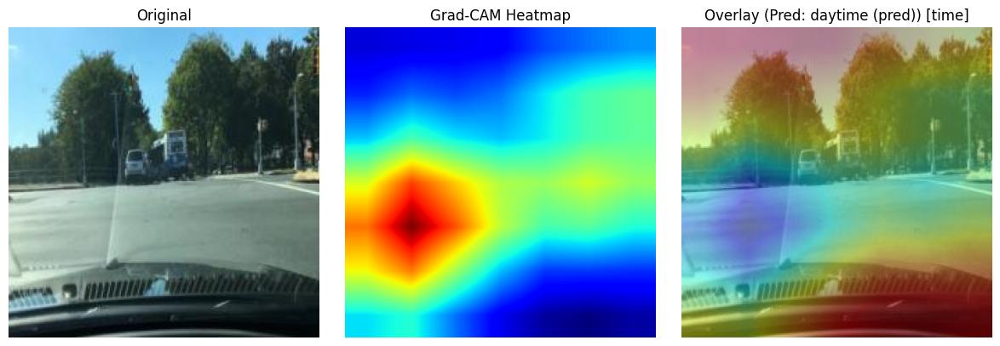

Weather : Pred = clear (0), True = clear (0) → Correct


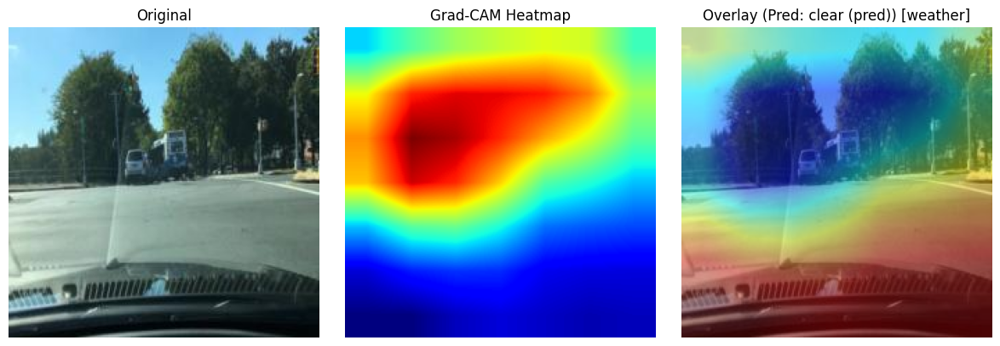


==== Sample 5 ====
Scene   : Pred = city street (0), True = residential (1) → Wrong


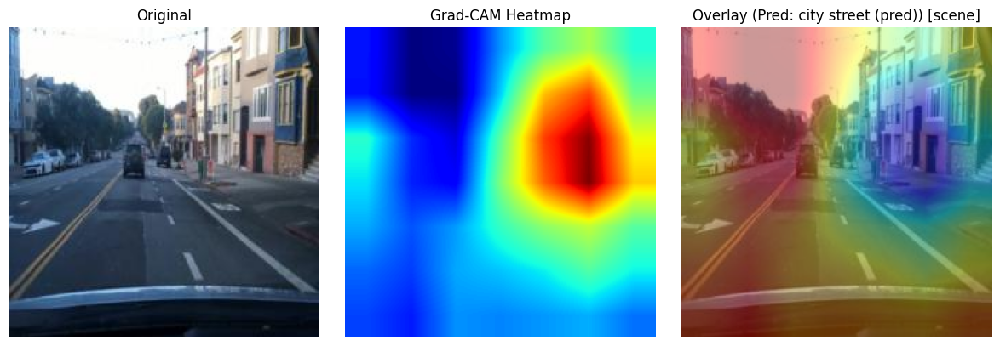

Time    : Pred = daytime (0), True = daytime (0) → Correct


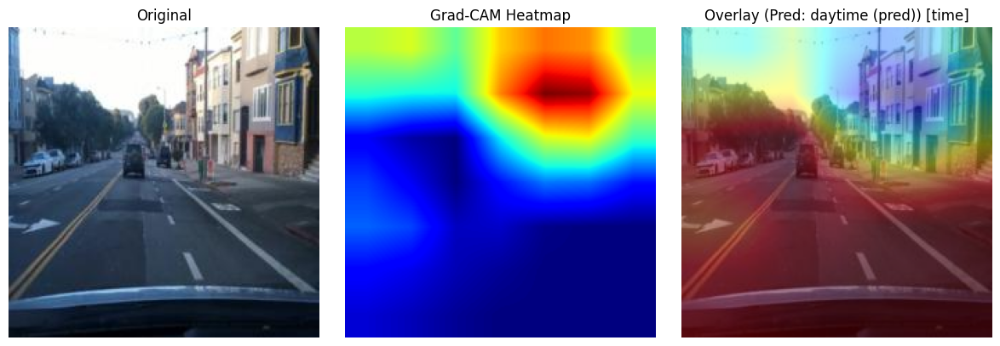

Weather : Pred = overcast (1), True = overcast (1) → Correct


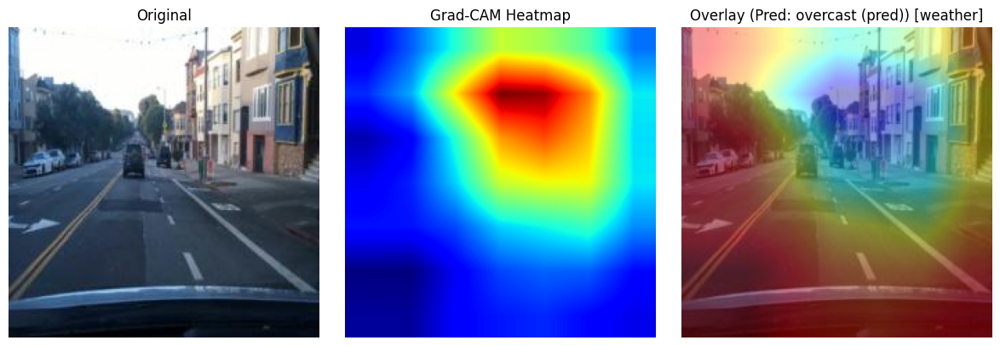

In [ ]:
# Visualize them
visualize_wrong_gradcams(wrong_samples)

# Object Detection using YOLOv5
## Goal of implementation: To identify vehicles, traffic lights (with color), and road signs.

In [ ]:
# Clone YOLOv5 repository and install dependencies
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install --quiet -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17521, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 17521 (delta 9), reused 0 (delta 0), pack-reused 17497 (from 4)
Receiving objects: 100% (17521/17521), 16.66 MiB | 19.14 MiB/s, done.
Resolving deltas: 100% (12001/12001), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta

In [ ]:
!mkdir -p datasets/bdd100k/images/train
!mkdir -p datasets/bdd100k/images/val
!mkdir -p datasets/bdd100k/labels/train
!mkdir -p datasets/bdd100k/labels/val

In [ ]:
import os, shutil, random
image_dir = '/content/bdd100k/10k/train'
label_dir = '/content/bdd100k/100k/train'

all_images = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
random.shuffle(all_images)

split_ratio = 0.8
split_index = int(len(all_images) * split_ratio)

train_imgs = all_images[:split_index]
val_imgs = all_images[split_index:]

for img in train_imgs:
    shutil.copy(os.path.join(image_dir, img), 'datasets/bdd100k/images/train/')

for img in val_imgs:
    shutil.copy(os.path.join(image_dir, img), 'datasets/bdd100k/images/val/')

In [ ]:
import json
from pathlib import Path

label_json_dir = '/content/bdd100k/100k/train'
output_dir = 'datasets/bdd100k/labels'
image_folder_train = 'datasets/bdd100k/images/train'
image_folder_val = 'datasets/bdd100k/images/val'

# Defining YOLO class mapping
label_map = {
    'car': 0,
    'truck': 1,
    'bus': 2,
    'person': 3,
    'traffic light': 4,
    'traffic sign': 5
}

def convert_json_to_yolo(json_file, split):
    with open(json_file) as f:
        data = json.load(f)

    name = data['name']
    if name + '.jpg' not in os.listdir(f'datasets/bdd100k/images/{split}'):
        return

    yolo_lines = []
    for frame in data['frames']:
        for obj in frame['objects']:
            if 'box2d' not in obj:
                continue
            cls = obj['category']
            if cls not in label_map:
                continue
            box = obj['box2d']
            x1, y1, x2, y2 = box['x1'], box['y1'], box['x2'], box['y2']
            xc = (x1 + x2) / 2 / 1280
            yc = (y1 + y2) / 2 / 720
            w = (x2 - x1) / 1280
            h = (y2 - y1) / 720
            cls_id = label_map[cls]
            yolo_lines.append(f"{cls_id} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}")

    if yolo_lines:
        label_path = Path(f"{output_dir}/{split}/{name}.txt")
        with open(label_path, 'w') as f:
            f.write("\n".join(yolo_lines))

# Converting all jsons
for json_file in os.listdir(label_json_dir):
    if json_file.endswith('.json'):
        convert_json_to_yolo(os.path.join(label_json_dir, json_file), 'train')
        convert_json_to_yolo(os.path.join(label_json_dir, json_file), 'val')

In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
data_yaml = """
train: /content/datasets/bdd100k/images/train
val: /content/datasets/bdd100k/images/val

nc: 6
names: ['car', 'truck', 'bus', 'person', 'traffic light', 'traffic sign']
"""

with open('bdd100k.yaml', 'w') as f:
    f.write(data_yaml)

In [ ]:
import os
os.environ["WANDB_MODE"] = "disabled"

In [ ]:
!python train.py --img 640 --batch 16 --epochs 10 --data bdd100k.yaml --weights yolov5s.pt --cache

Streaming output truncated to the last 5000 lines.
        2/9      4.16G    0.06058    0.04795    0.01329        301        640:  94% 328/350 [01:27<00:05,  4.01it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        2/9      4.16G    0.06058    0.04793    0.01328        179        640:  94% 329/350 [01:27<00:05,  3.98it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        2/9      4.16G    0.06057    0.04792    0.01328        223        640:  94% 330/350 [01:27<00:04,  4.05it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        2/9      4.16G    0.060

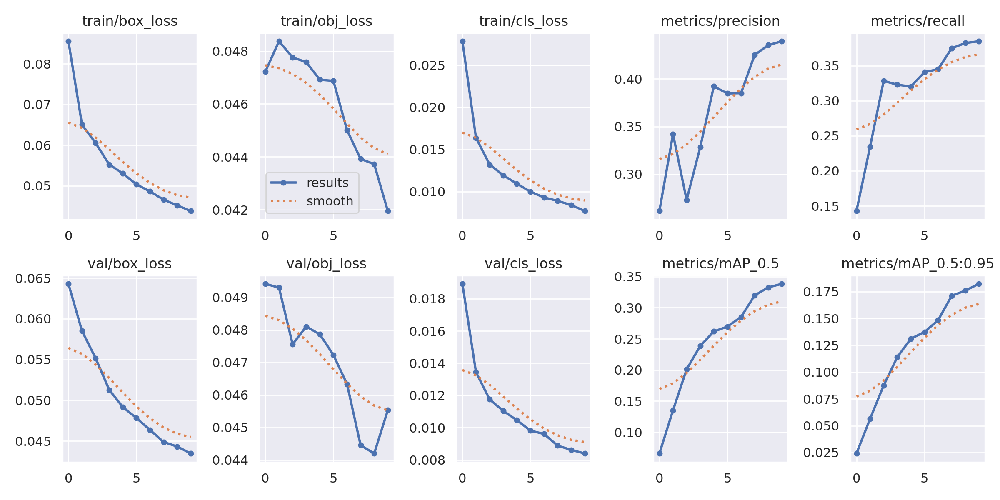

In [ ]:
from IPython.display import Image
Image(filename='runs/train/exp2/results.png')

In [ ]:
import torch

# Loading the trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='runs/train/exp2/weights/best.pt')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-8-7 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 720x1280 1 car
Speed: 25.6ms pre-process, 17.1ms inference, 1.7ms NMS per image at shape (1, 3, 384, 640)


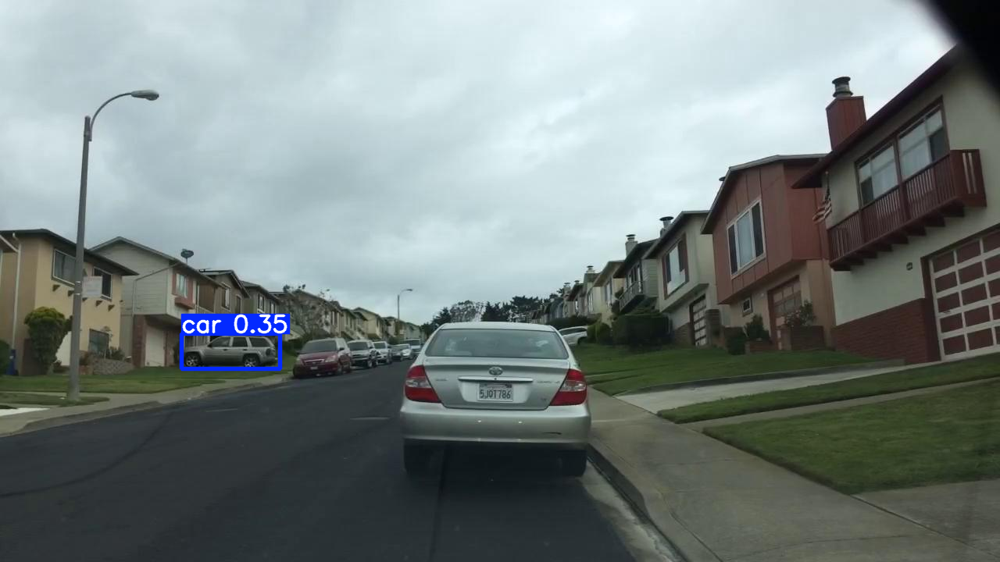

In [ ]:
img_path = '/content/bdd100k/10k/test/ac517380-00000000.jpg'

# Inference
results = model(img_path)
results.print()
results.show()

As the trained YOLO model (on our BDD100k dataset) is not predicting the objects in the image properly, we decided to move to pre-trained YOLO model.

In [ ]:
import torch
from matplotlib import pyplot as plt
from PIL import Image
import numpy as np

# Loading pretrained YOLOv5s model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model.eval()

/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2025-8-7 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 23.3MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 720x1280 9 cars
Speed: 8.7ms pre-process, 6.9ms inference, 2.5ms NMS per image at shape (1, 3, 384, 640)


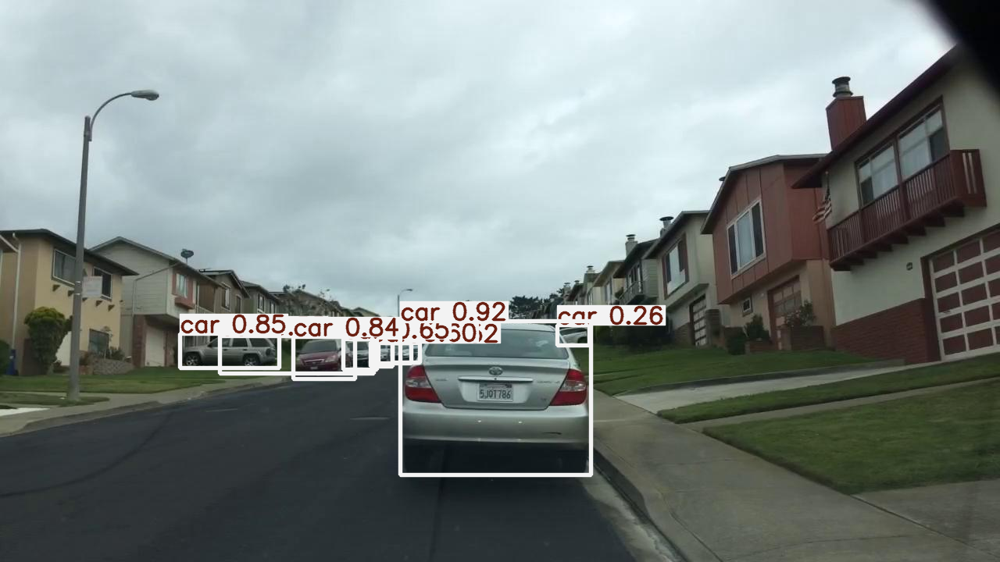

In [ ]:
results = model('/content/bdd100k/10k/test/ac517380-00000000.jpg')

results.print()
results.show()

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 720x1280 8 cars, 1 bus, 1 truck, 3 traffic lights
Speed: 13.7ms pre-process, 7.0ms inference, 2.7ms NMS per image at shape (1, 3, 384, 640)


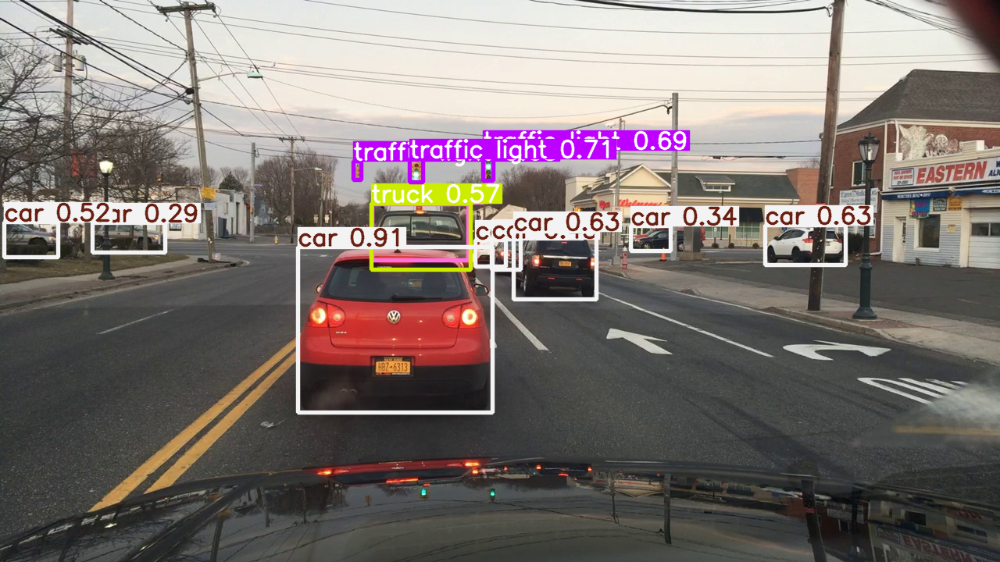

In [ ]:
results = model('/content/bdd100k/10k/test/ac9be3fe-790d1f8e.jpg')

results.print()
results.show()

Well, YOLOv5 detects the presence of traffic lights, but not their state (red, yellow, or green). So, to enhance the model’s understanding of the road scene, we implemented a post-processing function that classifies the **traffic light color** using pixel-wise HSV color thresholds. This adds semantic richness to our predictions.


In [ ]:
import cv2
import numpy as np
from PIL import Image

def classify_traffic_light_color(cropped_img):
    """Classify traffic light color as red, yellow, or green."""
    # Converting to HSV
    hsv = cv2.cvtColor(cropped_img, cv2.COLOR_RGB2HSV)

    # Defining HSV ranges
    red1 = cv2.inRange(hsv, (0, 70, 50), (10, 255, 255))
    red2 = cv2.inRange(hsv, (160, 70, 50), (180, 255, 255))
    red = cv2.bitwise_or(red1, red2)

    yellow = cv2.inRange(hsv, (15, 70, 50), (35, 255, 255))
    green = cv2.inRange(hsv, (40, 70, 50), (90, 255, 255))

    red_count = np.sum(red > 0)
    yellow_count = np.sum(yellow > 0)
    green_count = np.sum(green > 0)

    if max(red_count, yellow_count, green_count) < 50:
        return "unknown"

    if red_count > yellow_count and red_count > green_count:
        return "red"
    elif yellow_count > green_count:
        return "yellow"
    else:
        return "green"


So this custom function extends YOLOv5's detection capabilities by:
- Drawing bounding boxes with clear labels
- Overlaying traffic light colors next to detected lights
- Saving and displaying the result as an image

This enables effective visual validation of object detection results, especially for complex traffic scenarios.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import Image as IPImage, display

def detect_with_traffic_light_color(img_path):
    # Loading image with PIL and converting to RGB NumPy array
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)
    img_draw = img_np.copy()

    # Running YOLO inference
    results = model(img)
    df = results.pandas().xyxy[0]

    if df.empty:
        print("No objects detected.")
        return

    for index, row in df.iterrows():
        x1, y1, x2, y2 = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])
        label = row['name']

        # If it's a traffic light, classifying the light color
        if label == 'traffic light':
            cropped = img_np[y1:y2, x1:x2]
            if cropped.size > 0:
                color = classify_traffic_light_color(cropped)
                label += f" ({color})"

        # Drawing green bounding box
        cv2.rectangle(img_draw, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Drawing label background
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(img_draw, (x1, y1 - th - 4), (x1 + tw + 4, y1), (0, 0, 0), -1)

        # Drawing white label text
        cv2.putText(img_draw, label, (x1 + 2, y1 - 2),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

    # Saving output image and display
    img_bgr = cv2.cvtColor(img_draw, cv2.COLOR_RGB2BGR)
    output_path = "output.jpg"
    cv2.imwrite(output_path, img_bgr)

    print("=== Detection complete. Showing result:")
    display(IPImage(output_path))


=== Detection complete. Showing result:


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


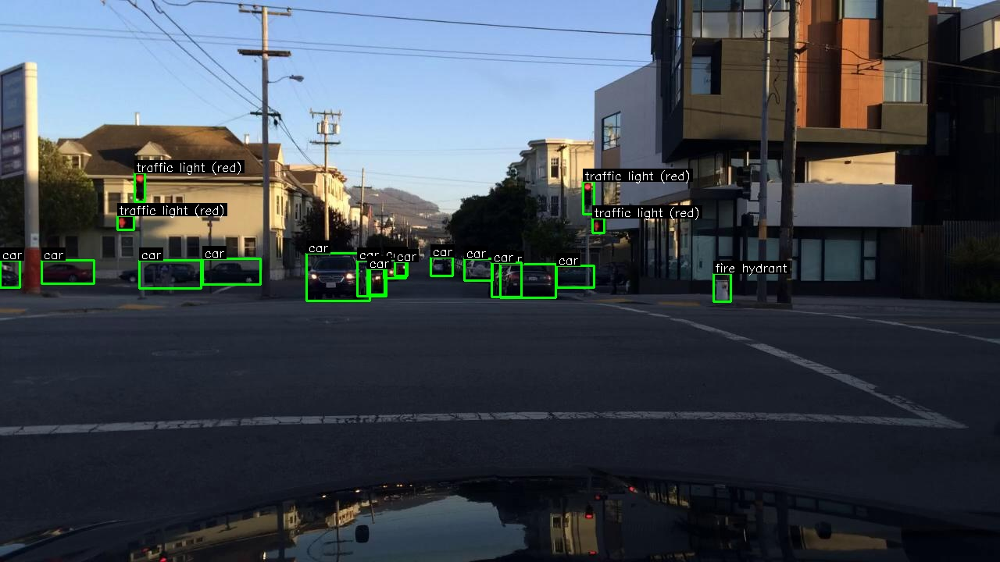

None

In [ ]:
image = '/content/bdd100k/10k/test/ac6d4f42-00000000.jpg'

output_img = detect_with_traffic_light_color(image)
display(output_img)

So this image illustrates the object detection results from YOLOv5 on a city intersection scenario under daylight conditions. Key details observed in the output:

- The model successfully detects **multiple traffic lights** and correctly classifies their **state as red**, using a post-processing color classification technique based on HSV color space thresholds.
- A large number of **cars** are identified both near and far in the frame, demonstrating YOLOv5's ability to handle scale variation and perspective.
- A **fire hydrant** is also detected on the sidewalk, indicating the model’s capability to detect smaller roadside objects that are critical for regulatory and safety-related applications.
- The **green bounding boxes** clearly mark the detected objects, while the **labels provide class information**. Traffic lights are further enhanced with the predicted color state in parentheses (e.g., `traffic light (red)`).
- This frame highlights how the model performs in a **densely populated urban setting**, with occlusions and overlapping objects still being handled accurately.

Such outputs are useful for real-time systems where understanding the traffic context (especially traffic signal states and surrounding vehicles) is crucial for autonomous navigation and decision-making.


In [ ]:
img_path = "/content/bdd100k/10k/test/ac6d4f42-00000000.jpg"
img = Image.open(img_path).convert('RGB')
results = model(img)

# Checking predictions
df = results.pandas().xyxy[0]
print(df)

          xmin        ymin        xmax        ymax  confidence  class  \
0   640.027832  338.180969  711.770752  381.864197    0.760836      2   
1    53.724751  333.458649  120.694138  363.587677    0.740447      2   
2   594.480286  331.119110  630.303772  359.655182    0.691826      2   
3   392.097198  324.839386  473.079620  385.255219    0.645760      2   
4   551.631592  329.125580  579.772095  353.806549    0.583086      2   
5   746.709290  232.876495  760.558411  274.312531    0.560310      9   
6   259.233459  331.610809  333.796570  364.398102    0.548218      2   
7   178.168365  333.529419  257.015717  369.564026    0.547466      2   
8     0.250813  333.499451   25.384117  368.424316    0.492816      2   
9   712.945007  340.704987  760.002136  368.101532    0.453954      2   
10  150.824493  276.132690  171.763550  294.830200    0.394173      9   
11  172.625076  221.701660  185.737137  258.377808    0.382522      9   
12  457.840607  333.166168  494.451508  379.006561 

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


=== Detection complete. Showing result:


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


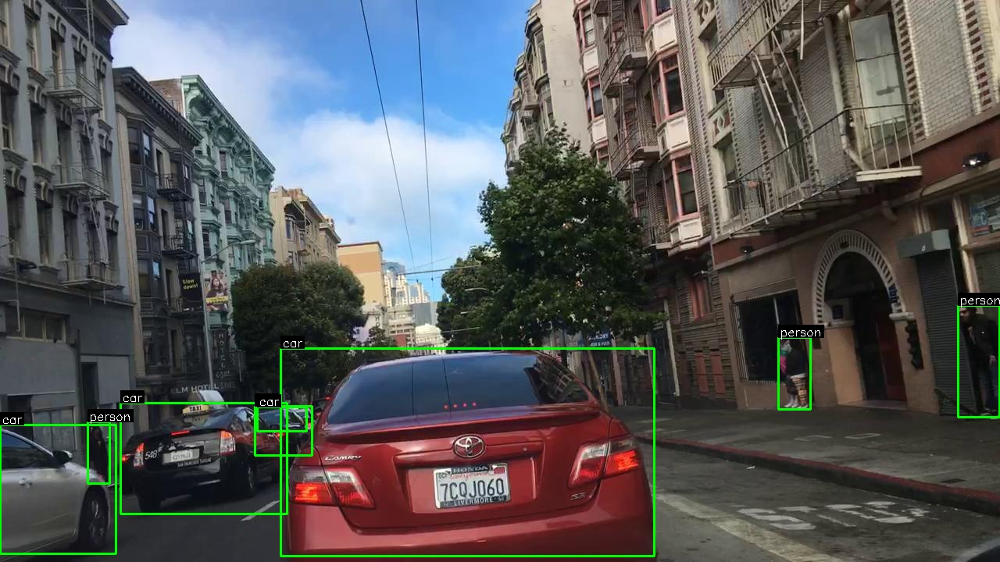

None

In [ ]:
image = '/content/bdd100k/10k/test/ae7bcd76-00000000.jpg'

output_img = detect_with_traffic_light_color(image)
display(output_img)

=== Detection complete. Showing result:


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


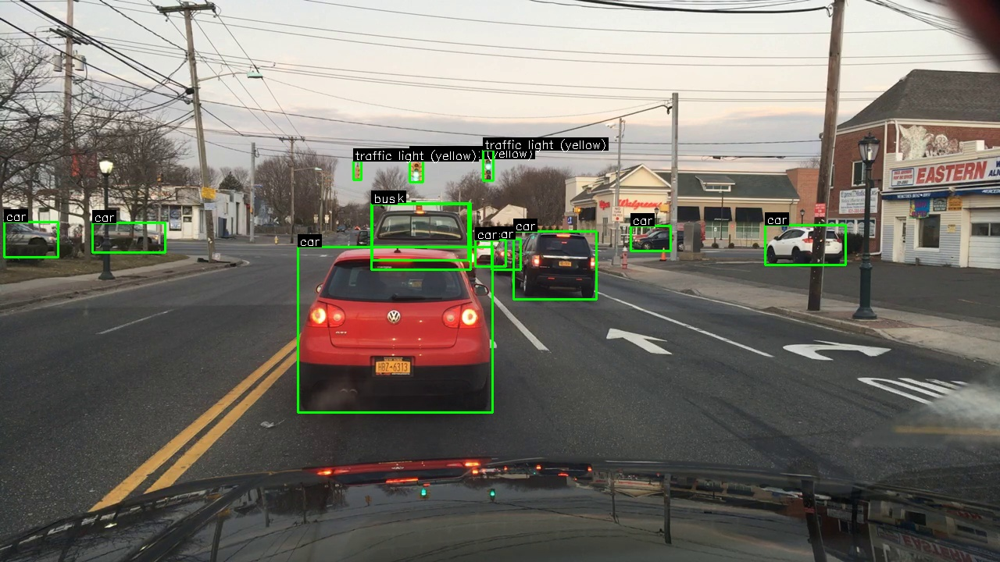

None

In [ ]:
image = '/content/bdd100k/10k/test/ac9be3fe-790d1f8e.jpg'

output_img = detect_with_traffic_light_color(image)
display(output_img)

**Batch Inference on Multiple Images**

To ensure robustness, we evaluated the detection function on a batch of test images. This helped us visualize how the model performs under varying traffic scenes, lighting conditions, and weather types.

=== Detection complete. Showing result:


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


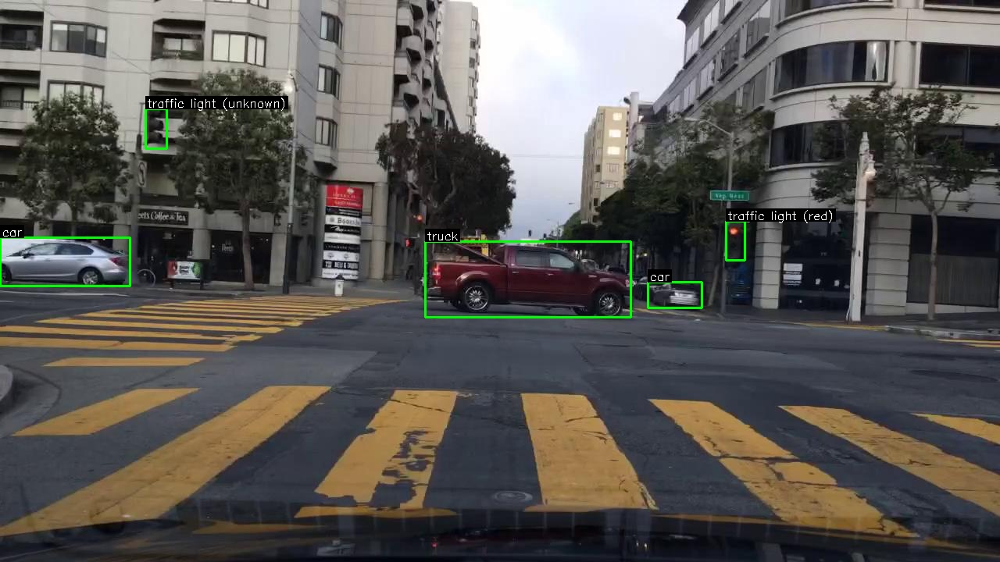

=== Detection complete. Showing result:


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


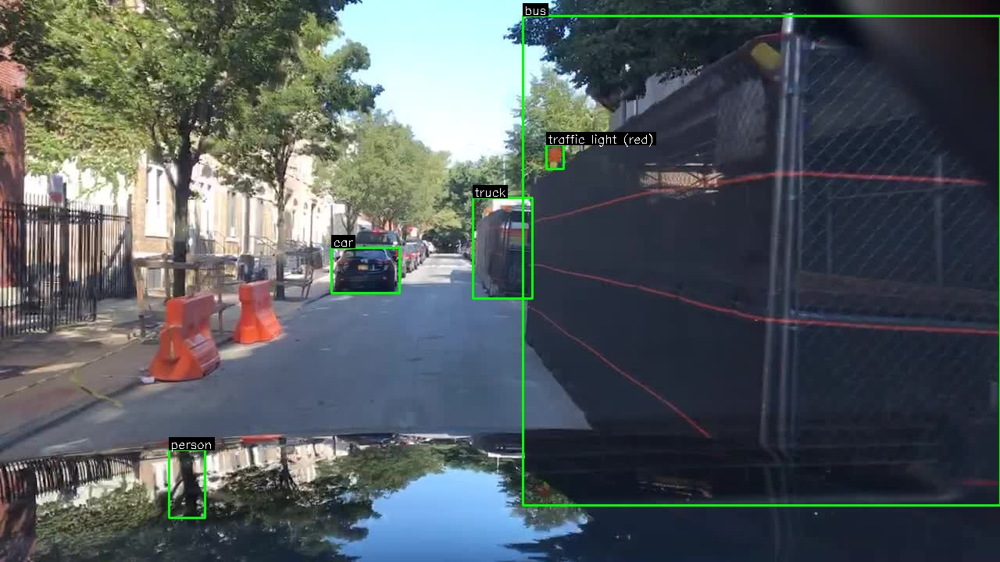

No objects detected.
=== Detection complete. Showing result:


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


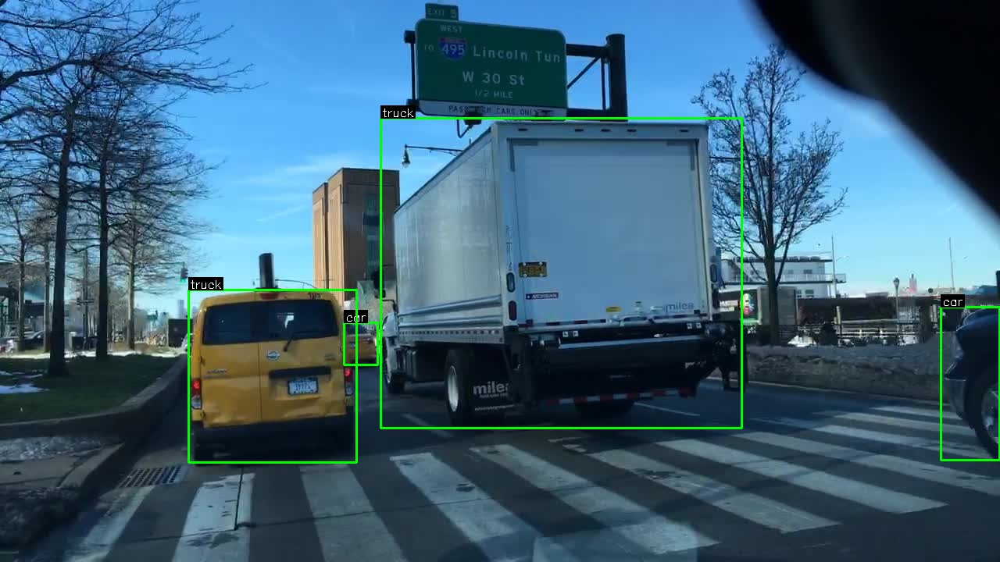

=== Detection complete. Showing result:


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


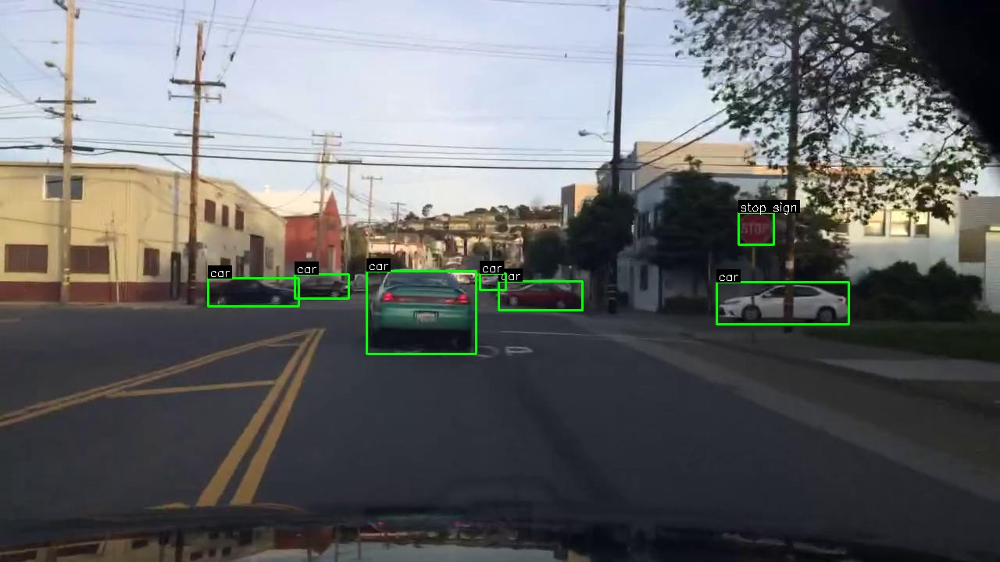

In [ ]:
import glob

test_paths = glob.glob('/content/bdd100k/10k/test/*.jpg')[:5]

for img_path in test_paths:
    detect_with_traffic_light_color(img_path)